In [2]:
import os
import sys

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

sys.path.append("/main_dir/felipe/projects/processor_apps/pkgs/CST")
from cst import distortion_layers as ly


# tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR) # ignores warnings

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-_zgo6nf3 because the default path (/.config/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


### Create distortion layers

In [5]:
dcs = {
#     1:{
#         "contrast": {"factor": [0.2, 0.2]},
#         "color": {"factor": [5,0,5]},
#         "blur": {"filter_shape": 1, "sigma": 0.},  # kernel size is 'filter_shape * 2 + 1'
#         "brightness": {"factor": 0.3}
#     },
    1:{
        "contrast": {"factor": [0.3, 0.3]},
        "color": {"factor": [5,0,5]},
        "blur": {"filter_shape": 4, "sigma": 0.},  # kernel size is 'filter_shape * 2 + 1'
        "brightness": {"lower": .85, "upper":1.15}
#         "brightness": {"lower":1.2999, "upper":1.3}
    },
    2:{
        "contrast": {"factor": [0.3, 0.3]},
        "color": {"factor": [5,0,5]},
        "blur": {"filter_shape": 2, "sigma": 1.},
        "brightness": {"lower": .85, "upper":1.15}
#         "brightness": {"lower":0.7, "upper":1.3}
    },
    3:{
        "contrast": {"factor": [0.4, 0.6]},
        "color": {"factor": [20,0,20]},
        "blur": {"filter_shape": 2, "sigma": 5.},
        "brightness": {"lower": .85, "upper":1.15}
#         "brightness": {"lower":0.7, "upper":1.3}
    },
    4:{
        "contrast": {"factor": [0.4, 0.6]},
        "color": {"factor": [20,20,20]},
        "blur": {"filter_shape": 4, "sigma": 5.},
        "brightness": {"lower": .85, "upper":1.15}
#         "brightness": {"lower":0.7, "upper":1.3}
    }
}


layers_1 = [
    ly.DistortionLayer(layers=[
        ly.RandomColorByChannel(**dcs[i]["color"]), 
        tf.keras.layers.RandomContrast(**dcs[i]["contrast"]),
        ly.RandomBrightness(**dcs[i]["brightness"]),
        ly.RandomGaussianBlur(**dcs[i]["blur"])])
    for i in dcs
]

layers_2 = [
    ly.DistortionLayer(layers=[
        ly.RandomColorByChannel(**dcs[i]["color"]), 
        tf.keras.layers.RandomContrast(**dcs[i]["contrast"]),
        ly.RandomBrightness(**dcs[i]["brightness"]),
        ly.RandomGaussianBlur(**dcs[i]["blur"])])
    for i in dcs
]


In [6]:
tf.__version__

'2.8.0'

### Load images

#### Option 1: own data set
If the notebook is ran from Docker and an absolute path wants to be provided for the train_path, make sure that the path corresponds to the docker path based on the volume used with docker run.

Otherwise, just load the data into the data folder

In [7]:
data_path = "../data"
tile_size = 128
batch_size = 20

gen = tf.keras.preprocessing.image.ImageDataGenerator(
    validation_split = 0.2
)
flow = gen.flow_from_directory(
    directory=data_path,
    target_size=(tile_size,tile_size),
    color_mode='rgb',  # 'rgb' or 'grayscale' 
    batch_size=batch_size,
)


Found 95 images belonging to 2 classes.


2023-08-01 14:10:28.248957: I tensorflow/stream_executor/cuda/cuda_blas.cc:1786] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2023-08-01 14:10:28.573186: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8100


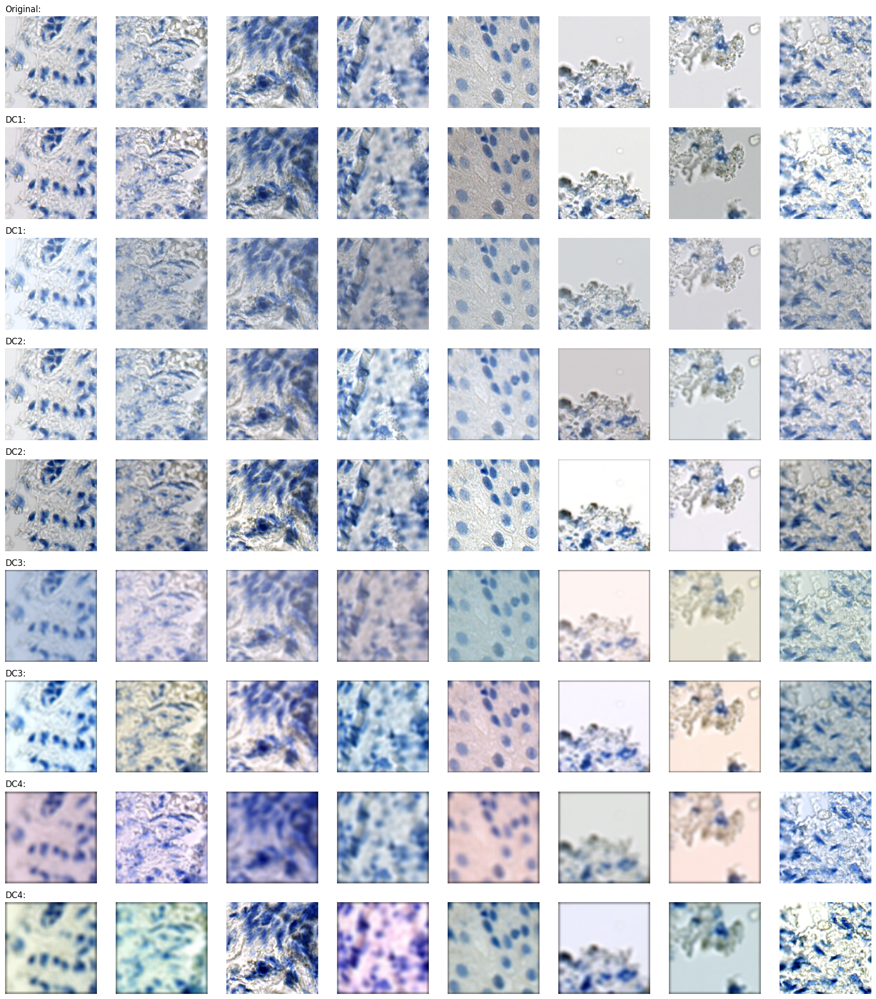

In [8]:
def visualize_augmentations(layers, num_images):
    # Sample a batch from a dataset
    batch = next(iter(flow))
    if type(batch) == tuple:
        images = batch[0][:num_images]
    else:
        images = batch[:num_images]
    # Apply augmentations
    augmented_images = zip(
        images.astype(int),
        layers[0](images).numpy().astype(int),
        layers[0](images).numpy().astype(int),
        layers[1](images).numpy().astype(int),
        layers[1](images).numpy().astype(int),
        layers[2](images).numpy().astype(int),
        layers[2](images).numpy().astype(int),
        layers[3](images).numpy().astype(int),
        layers[3](images).numpy().astype(int),
    )
    row_titles = [
        "Original:",
        "DC1:",
        "DC1:",
        "DC2:",
        "DC2:",
        "DC3:",
        "DC3:",
        "DC4:",
        "DC4:",
    ]
    plt.figure(figsize=(num_images * 2.2, 9 * 2.2), dpi=100)
    for column, image_row in enumerate(augmented_images):
        for row, image in enumerate(image_row):
            plt.subplot(9, num_images, row * num_images + column + 1)
            plt.imshow(image)
            if column == 0:
                plt.title(row_titles[row], loc="left")
            plt.axis("off")
    plt.tight_layout()


visualize_augmentations(layers_1, num_images=8)

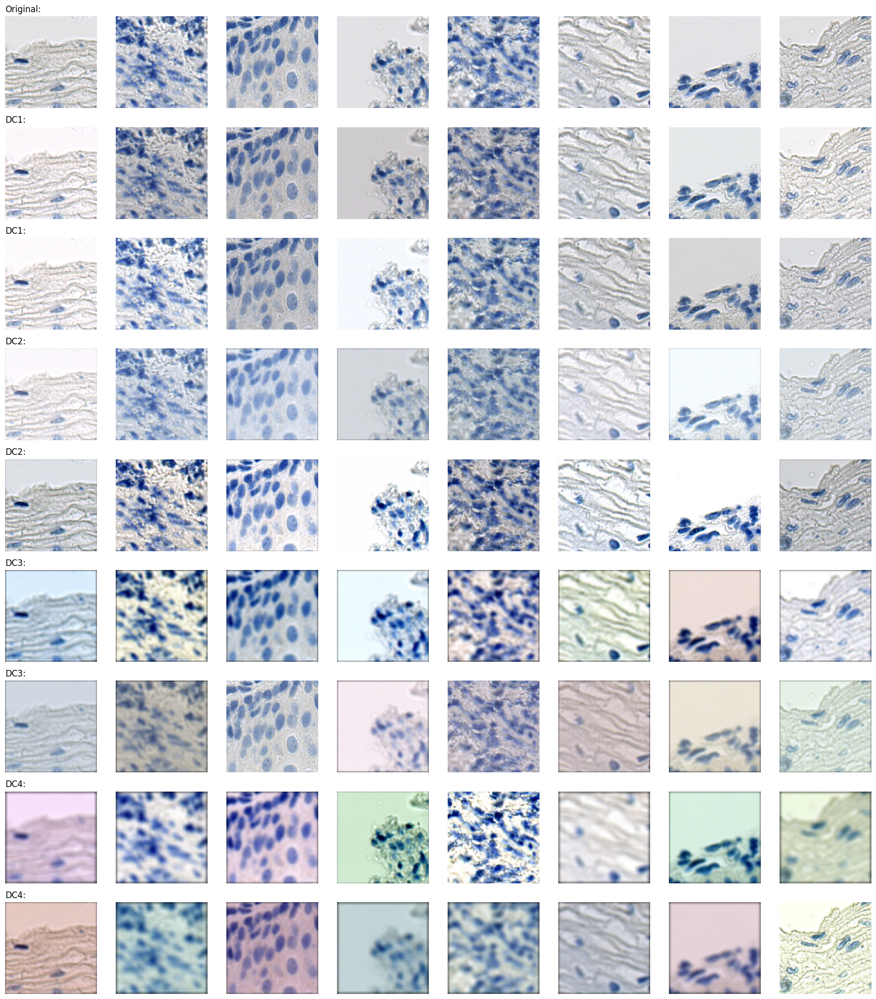

In [9]:
visualize_augmentations(layers_2, num_images=8)

#### Option 2: try it on cifar